# Experiments

* InfoGAN-simplified 버전에서 Q-encoder 를 따로 떼어보자.
* Q 는 c 를 잘 만들면 된다.
* 이렇게 하면 비로소 DiscoGAN-(b) 형태가 됨. (GAN with reconstruction model)

![discogan_models](models_discogan.png)

* Common points
    * 위 그림은 DiscoGAN 의 그림으로, 여기서 (b) 가 InfoGAN 에 가까움.
    * G_BA 가 InfoGAN 의 encoder Q 에 해당하며, InfoGAN 에서는 D 와 네트워크를 일정 부분 쉐어함
        * Q를 학습할 때 따로 하지 않고 D_loss + Q_loss 로 한꺼번에 학습
        * 따로 해도 별 문제는 없을 듯
        * 어차피 로스를 더해주므로, shared_net 은 두번 학습되는것과 마찬가지임.
* Difference points
    * InfoGAN 이 훨씬 더 수학적 이론에 근거한 principled way 라고 할 수 있음
    * 다만, DiscoGAN 에 따르면 Cycle-consistency (c) 를 사용하지 않을 경우 문제가 발생할 수 있다고 하는데 InfoGAN 에서는 왜 그러한 문제가 발생하지 않는지 알 수 없음

![analysis](analysis_discogan.png)

* fig 3-(c) 가 InfoGAN 구조에 대한 문제점 지적
* mode-collapse 가 발생할 수 있음
* InfoGAN 식으로 말하면:
    * G 가 c 에 상관없이 무조건 1만 생성하게 되고
    * Q 는 그럼 1로부터 다양한 c 를 생성해야 하므로 oscilliating 하게 된다.
* Why this problem does not occur in InfoGAN?
    * 가설 1) InfoGAN 은 G 를 학습할 때에도 Q_loss 를 더해줌.
        * 즉, G 는 학습 과정에서 Q 가 c 를 잘 생성하는것까지 고려하게 된다.
        * 따라서 이러한 문제가 발생하지 않는 것은 아닐까?
        * => 생각해 보니 이건 당연한 거다. G 를 학습하는데 Q_loss 를 고려하지 않으면 이건 그냥 DCGAN임. G 는 c 로 잘 돌아오건 말건 관심없이 제너레이팅을 할테니 c와 G(z,c) 간에 관련성을 고려하지 않는다.
    * 가설 2) 그럼 D 를 학습할 때 Q_loss 를 더해주는게 포인튼가?
        * 해보니까 Q_loss 를 빼면 oscillating 이 발생함!
        * 이건 좀 이상한게, Q_loss 를 빼버리면 아예 encoder Q 가 학습이 안되는거임.
        * Q 가 전혀 학습이 되지 않음에도 불구하고 InfoGAN 이 적당히는 작동하는 이유는?
            * G_loss = G_loss + Q_loss
                * G 는 D 를 잘 속여야 하며, 동시에 c 를 잘 만들어내도록 x' 을 만들어야 한다.
            * D_loss = D_loss + Q_loss
                * D 는 real/fake 를 잘 구분해야 하며, Q 는 c 를 잘 만들어야 한다.
                * 여기서 Q_loss 가 빠지면 Q 가 학습이 안 된다.
                * 하지만 G 는 여전히 c 를 잘 만들어내도록 x' 을 만든다.

## Experiments

* G_loss without Q_loss
    * G_loss 에서 Q_loss 를 빼면?
    * 위에서 쓴 것처럼 그냥 DCGAN 이 되고 latent code c 는 전혀 의미가 없어짐
* D_loss without Q_loss
    * Oscilliating 발생
    * Why works?
        * 일단 latnt code c 를 포착하긴 한다. encoder Q 가 학습되지 않음에도 불구하고.
        * 이건 일단 shared net 덕분이긴 할 것 같은데.
    * Why oscilliating?
        * G 가 처음에 c=0 에 대해서 x=1 을 생성했다고 하자. 이때 Q(x)=0 이 나와야 하는데 아마 그렇지 못하겠지.
        * 따라서 G 는 Q_loss 를 줄이기 위해서 움직인다 - 동시에 D_loss 도 줄이면서.
        * 문제는, 어떤 코드 c 에 대해서 Q_loss 를 줄이기 위해서는 다른 코드 c 의 Q_loss 가 늘어난다는 것이다! (가설)
        * 따라서 계속 각 코드 c 에 대한 Q_loss 를 줄여 가면서 oscilliating 한다! => tensorboard 로 확인해보자
        * 이게 encoder Q 가 학습되면 이런 문제가 없을텐데 학습이 안 되기 때문에 동시에 여러 c 에 대해서 Q_loss 를 줄이지 못함.

## ToDo

* 잘 모르겠으니 DiscoGAN 방식으로 한번 구현해보자.
* InfoGAN 에 적용했을 때 어떻게 되는지.

In [62]:
%matplotlib inline
import tensorflow as tf
import numpy as np
from tensorflow.examples.tutorials.mnist import input_data
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [63]:
slim = tf.contrib.slim

In [64]:
mnist = input_data.read_data_sets("../MNIST_data/", one_hot=True)

Extracting ../MNIST_data/train-images-idx3-ubyte.gz
Extracting ../MNIST_data/train-labels-idx1-ubyte.gz
Extracting ../MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../MNIST_data/t10k-labels-idx1-ubyte.gz


In [65]:
import warnings

warnings.simplefilter('error')

def expected_shape(tensor, expected):
    """batch size N is set to None. you can use shape instead of tensor.
    None indicates shape `?`.
    
    Usage:
    expected_shape(tensor, [None, 28, 28, 1])
    expected_shape(tensor.shape, [None, 28, 28, 1])
    """
    if isinstance(tensor, tf.Tensor):
        shape = tensor.shape
    else:
        shape = tensor
    shape = map(lambda x: x.value, shape)
    if not shape == expected:
        warnings.warn('wrong shape {} (expected shape is {})'.format(shape, expected))

In [66]:
# 사실 이 세팅은 # of disc r.v. = 1 이라고 가정한 것
c_disc_dim = 10
c_cont_dim = 0
c_dim = c_disc_dim + c_cont_dim

In [67]:
def lrelu(x, leak=0.1, name="lrelu"):
    with tf.variable_scope(name):
        f1 = 0.5 * (1 + leak)
        f2 = 0.5 * (1 - leak)
        return f1 * x + f2 * abs(x)

In [68]:
def generator(z, reuse=False):
    with tf.variable_scope("generator", reuse=reuse):
        with slim.arg_scope([slim.fully_connected, slim.conv2d_transpose], 
                            normalizer_fn=slim.batch_norm, normalizer_params=bn_params,
                            activation_fn=tf.nn.relu):
            net = z
            net = slim.fully_connected(net, 1024)
            net = slim.fully_connected(net, 7*7*128)
            net = tf.reshape(net, [-1, 7, 7, 128])
            net = slim.conv2d_transpose(net, 64, [4,4], stride=2)
            net = slim.conv2d_transpose(net, 1, [4,4], stride=2, activation_fn=tf.nn.sigmoid, normalizer_fn=None)
            expected_shape(net, [None, 28, 28, 1])
            
            return net

In [69]:
def discriminator(x, reuse=False):
    with tf.variable_scope("discriminator", reuse=reuse):
        with slim.arg_scope([slim.fully_connected, slim.conv2d],
                            normalizer_fn=slim.batch_norm, normalizer_params=bn_params,
                            activation_fn=lrelu):
            net = tf.reshape(x, [-1, 28, 28, 1])
            net = slim.conv2d(net, 64, [4,4], stride=2, normalizer_fn=None)
            net = slim.conv2d(net, 128, [4,4], stride=2)
            net = slim.flatten(net)
            net = slim.fully_connected(net, 1024)
            # D
            d_logits = slim.fully_connected(net, 1, activation_fn=None, normalizer_fn=None)
            expected_shape(d_logits, [None, 1])
            # Q
            with tf.variable_scope("Q"):
                q_net = slim.fully_connected(net, 128)
                q_logits = slim.fully_connected(q_net, c_dim, activation_fn=None, normalizer_fn=None)
                expected_shape(q_logits, [None, c_dim])
            
            # 이건 액티베이션 값이고, weights 를 보자.
            tf.summary.histogram('q_net', q_net)
            tf.summary.histogram('q_logits', q_logits)
            
            return d_logits, q_logits

In [70]:
# for tf.losses module: this module emits INFO level logs (but does not informative)
tf.logging.set_verbosity(tf.logging.ERROR)

In [139]:
# build nets
tf.reset_default_graph()

X = tf.placeholder(tf.float32, [None, 784])
training = tf.placeholder(tf.bool)
z = tf.placeholder(tf.float32, [None, 62])
c = tf.placeholder(tf.float32, [None, c_dim])
c_disc, c_cont = tf.split(c, [c_disc_dim, c_cont_dim], axis=1)

# BN 다음 activ fn 이 linear (lrelu/relu) 이므로 사실 scale 은 false 여도 된다.
bn_params = {
    'is_training': training, # global placeholder training
    'scale': True, 
    'decay': 0.99
}

zc = tf.concat([z, c], axis=1)

G_sample = generator(zc)
D_real_logits, c_real_logits = discriminator(X)
D_fake_logits, c_fake_logits = discriminator(G_sample, reuse=True)
c_fake_logits_disc, c_fake_logits_cont = tf.split(c_fake_logits, [c_disc_dim, c_cont_dim], axis=1)

# tip: tf.losses.log_loss = tf.losses.binary_cross_entropy
# 물론 tf.losses.binary_cross_entropy 는 없음.
# tf.nn.sigmoid_CE 를 쓰면 나중에 이걸 다시 reduce_mean 해줘야 하는데, 
# tf.losses.sigmoid_CE 는 그것까지 해준다.

D_loss_real = tf.losses.sigmoid_cross_entropy(tf.ones_like(D_real_logits), D_real_logits, scope='D_loss/real')
D_loss_fake = tf.losses.sigmoid_cross_entropy(tf.zeros_like(D_fake_logits), D_fake_logits, scope='D_loss/fake')
D_loss = D_loss_real + D_loss_fake

G_loss = tf.losses.sigmoid_cross_entropy(tf.ones_like(D_fake_logits), D_fake_logits, scope='G_loss')

Q_loss_disc = tf.losses.softmax_cross_entropy(c_disc, c_fake_logits_disc, scope='Q_loss/disc')
c_fake_probs_cont = tf.nn.sigmoid(c_fake_logits_cont)
Q_loss_cont = tf.losses.mean_squared_error(c_cont, c_fake_probs_cont, scope='Q_loss/cont')
Q_loss = Q_loss_disc + Q_loss_cont

# 각 (discrete) latent code c 에 대한 Q_loss 를 계산해보자.
with tf.variable_scope("experiments"):
    exp_Q_loss_disc = tf.nn.softmax_cross_entropy_with_logits(labels=c_disc, logits=c_fake_logits_disc)
#     print exp_Q_loss_disc
    expected_shape(exp_Q_loss_disc, [None, ])
    # how to aggregate loss by latent code c using tf?


# 인코더 Q 는 결국 mutual information 을 나타내고, 잘 갔다가 잘 돌아와야 한다.
# 이걸 따로 트레이닝하느냐 한군데에 붙이느냐... 는 따로 트레이닝하는것도 가능하다. 
# 어차피 아래에서 G_vars 에는 Q가 포함되어 있지 않아서 G_loss 에 포함될 뿐 G 를 학습할 때 Q까지 학습되는 것은 아님.
# D_var 에 Q 가 포함되어 있으므로 D 와 Q 는 한번에 같이 학습이 된다. 따로 해도 상관 없을 듯.

D_loss += Q_loss
G_loss += Q_loss
D_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='discriminator')
G_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')
D_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='discriminator')
G_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='generator')
with tf.control_dependencies(G_update_ops):
    G_train_op = tf.train.AdamOptimizer(learning_rate=0.005, beta1=0.5).minimize(G_loss, var_list=G_vars)
with tf.control_dependencies(D_update_ops):
    D_train_op = tf.train.AdamOptimizer(learning_rate=0.0001, beta1=0.5).minimize(D_loss, var_list=D_vars)

tf.summary.scalar('D_loss', D_loss)
tf.summary.scalar('D_loss/real', D_loss_real)
tf.summary.scalar('D_loss/fake', D_loss_fake)
tf.summary.scalar('G_loss', G_loss)
tf.summary.scalar('Q_loss', Q_loss)

Q_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='discriminator/Q/')
tf.summary.histogram('q_W1', Q_vars[0])
tf.summary.histogram('q_W2', Q_vars[3])
tf.summary.histogram('q_b2', Q_vars[4])

summary_op = tf.summary.merge_all()

print("build network done ...")

build network done ...


In [72]:
Q_vars

[<tf.Variable 'discriminator/Q/fully_connected/weights:0' shape=(1024, 128) dtype=float32_ref>,
 <tf.Variable 'discriminator/Q/fully_connected/BatchNorm/beta:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'discriminator/Q/fully_connected/BatchNorm/gamma:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'discriminator/Q/fully_connected_1/weights:0' shape=(128, 10) dtype=float32_ref>,
 <tf.Variable 'discriminator/Q/fully_connected_1/biases:0' shape=(10,) dtype=float32_ref>]

In [73]:
# check: discriminator_1 이 생기면 안되는거 아닌가?
# reuse=True 인데?
tf.get_collection(tf.GraphKeys.SUMMARIES)

[<tf.Tensor 'discriminator/q_net:0' shape=() dtype=string>,
 <tf.Tensor 'discriminator/q_logits:0' shape=() dtype=string>,
 <tf.Tensor 'discriminator_1/q_net:0' shape=() dtype=string>,
 <tf.Tensor 'discriminator_1/q_logits:0' shape=() dtype=string>,
 <tf.Tensor 'D_loss:0' shape=() dtype=string>,
 <tf.Tensor 'D_loss/real_1:0' shape=() dtype=string>,
 <tf.Tensor 'D_loss/fake_1:0' shape=() dtype=string>,
 <tf.Tensor 'G_loss_1:0' shape=() dtype=string>,
 <tf.Tensor 'Q_loss:0' shape=() dtype=string>,
 <tf.Tensor 'q_W1:0' shape=() dtype=string>,
 <tf.Tensor 'q_W2:0' shape=() dtype=string>,
 <tf.Tensor 'q_b2:0' shape=() dtype=string>]

In [74]:
# 62 / 10 / 2

def sample_z(n):
#     return np.random.randn(n, 62) # standard normal dist
    return np.random.uniform(-1, 1, [n, 62]) # uniform

def sample_c_disc(n):
    return np.random.multinomial(1, [1./c_disc_dim]*c_disc_dim, size=n)

def sample_c_cont(n):
    return np.random.uniform(-1, 1, [n, c_cont_dim])

def sample_c(n):
    return np.concatenate([sample_c_disc(n), sample_c_cont(n)], axis=1)

In [75]:
def plot(samples, wh=4):
    if len(samples) != wh*wh:
        print("Error: # of samples = {} but wh is {}".format(len(samples), wh))
        return
    
    fig = plt.figure(figsize=(wh, wh))
    gs = gridspec.GridSpec(wh, wh)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

    return fig

In [82]:
def plot_100(c_cont=np.zeros([100, c_cont_dim])):
    n = 100
    z_ = sample_z(n)
    c1_ = np.zeros([n, c_disc_dim])
    idx = np.arange(n) / int(n**0.5)
    c1_[range(n), idx] = 1
    c_ = np.concatenate([c1_, c_cont], axis=1)
    samples = sess.run(G_sample, {z: z_, c: c_, training: False})
    fig = plot(samples, 10)
    plt.show()

In [77]:
def plot_c1():
    z_ = sample_z(16)
    # c1 을 이렇게 줘야 같은 c1 다른 noise z_ 에 대해서 동일한 샘플을 생성하는지 알 수 있음
    idx = np.random.randint(0, 10)
    c1_ = np.zeros([16, 10])
    c1_[range(16), idx] = 1
    c23_ = sample_c_cont(16)
    c_ = np.concatenate([c1_, c23_], axis=1)
    samples = sess.run(G_sample, {z: z_, c: c_, training: False})
    fig = plot(samples)
    plt.show()

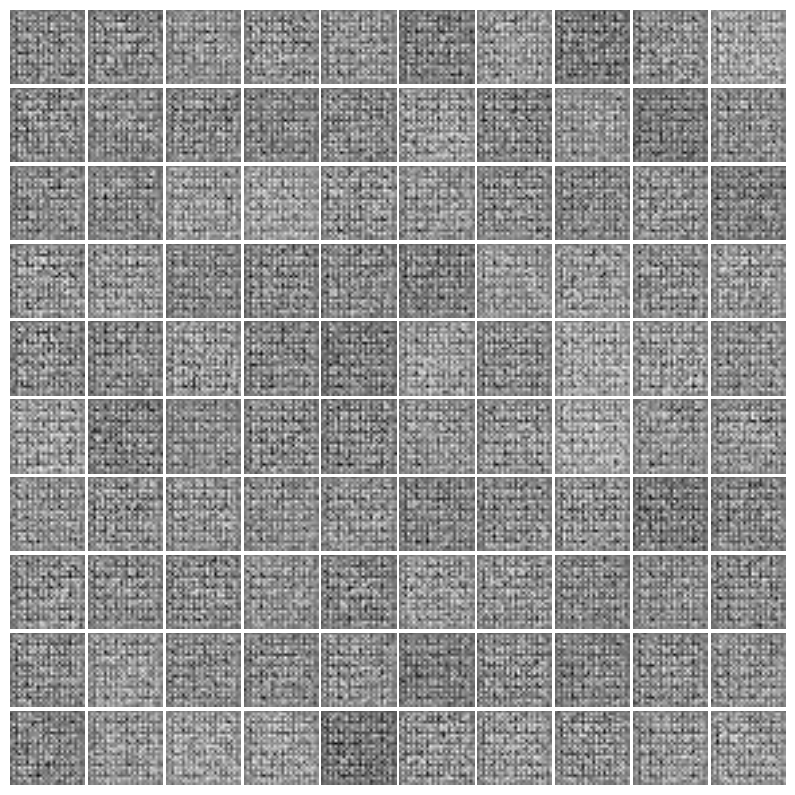

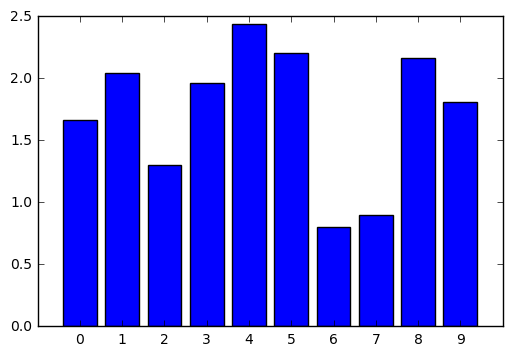

[1/30000] D_loss: 4.3282 | G_loss: 2.5285 | Q_loss: 1.7811
[ 1.66559082  2.04721892  1.30062196  1.96046731  2.44283816  2.20167123
  0.8042278   0.89590722  2.16605417  1.80962955]


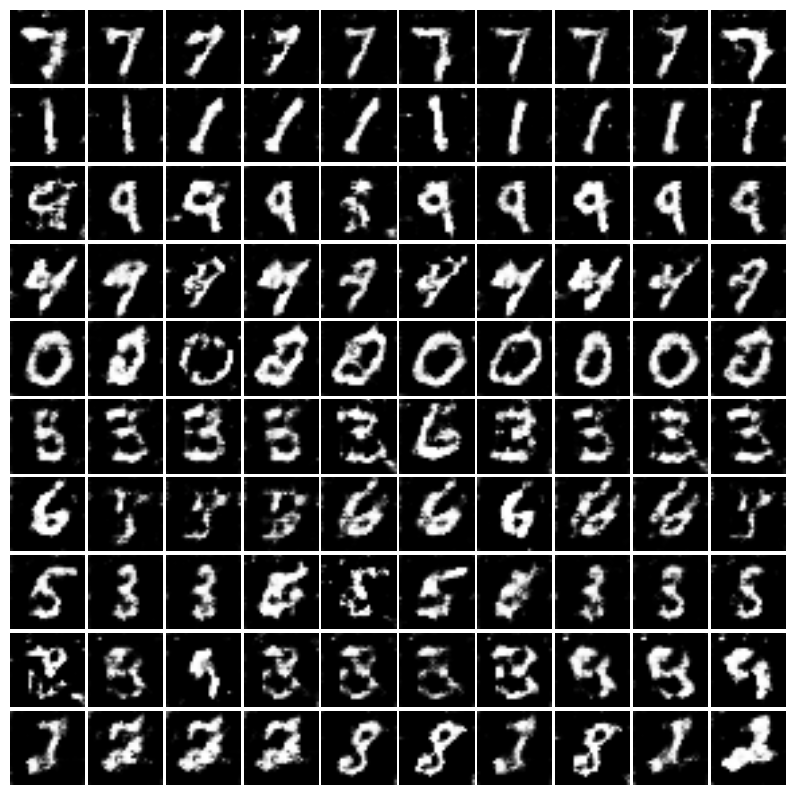

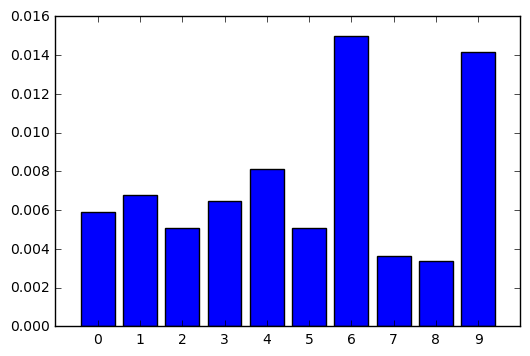

[1001/30000] D_loss: 1.3009 | G_loss: 0.8021 | Q_loss: 0.0075
[ 0.00590588  0.0067671   0.00506019  0.00645422  0.00814875  0.00508663
  0.01496742  0.00365162  0.00338139  0.01415876]


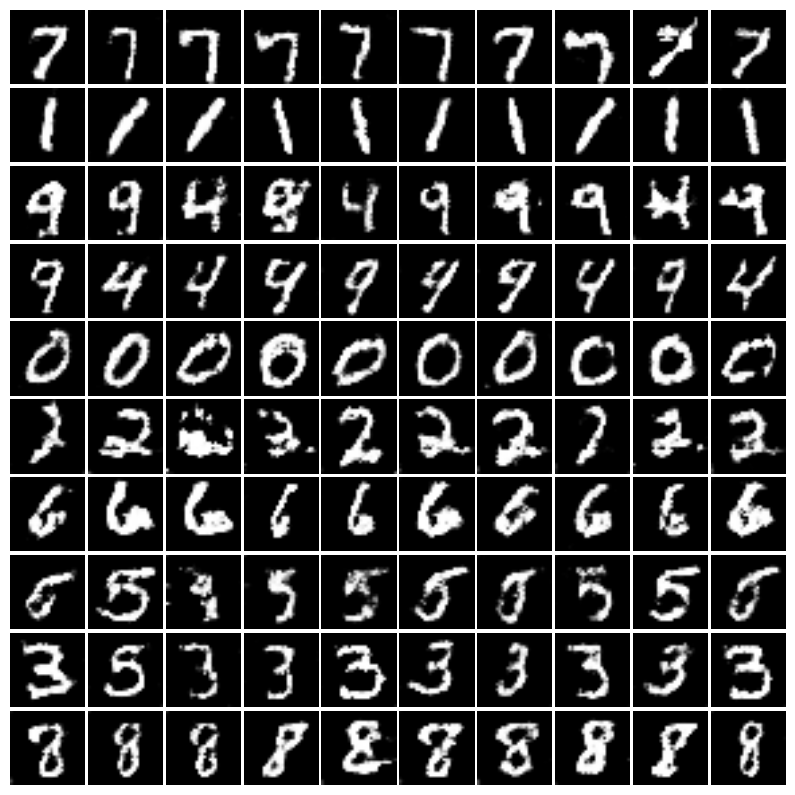

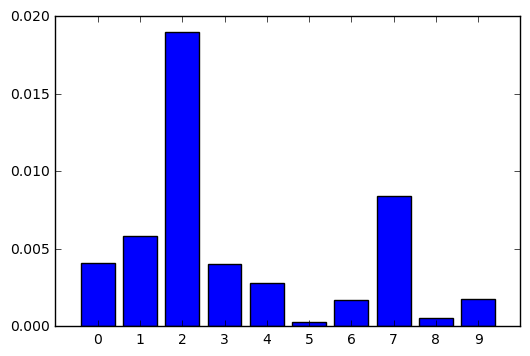

[2001/30000] D_loss: 1.3392 | G_loss: 0.7858 | Q_loss: 0.0058
[ 0.00410846  0.00585508  0.01896601  0.00401001  0.00277962  0.00028165
  0.0017244   0.008428    0.0005629   0.00176012]


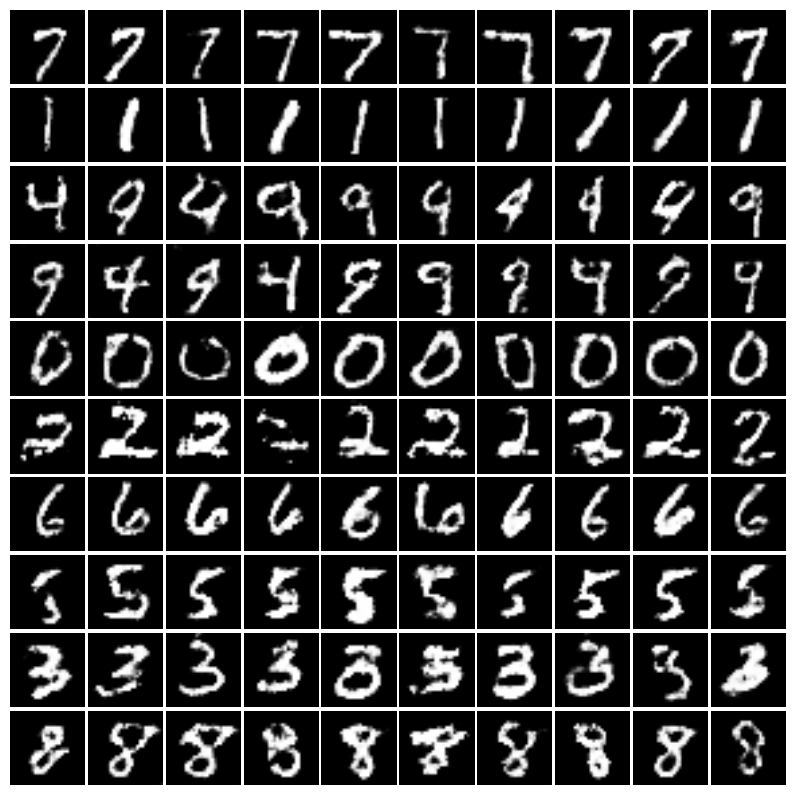

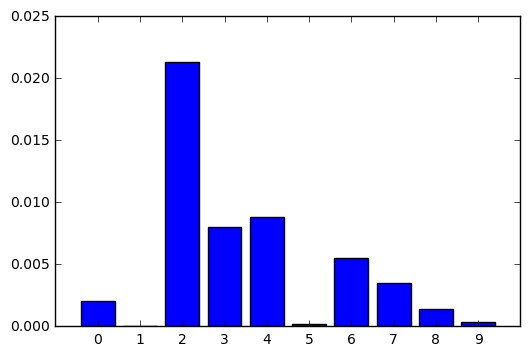

[3001/30000] D_loss: 1.3379 | G_loss: 0.7921 | Q_loss: 0.0063
[  2.08195935e-03   5.94824201e-05   2.13661787e-02   8.02810080e-03
   8.79899162e-03   1.77709364e-04   5.49975321e-03   3.51562078e-03
   1.41628210e-03   3.82493061e-04]


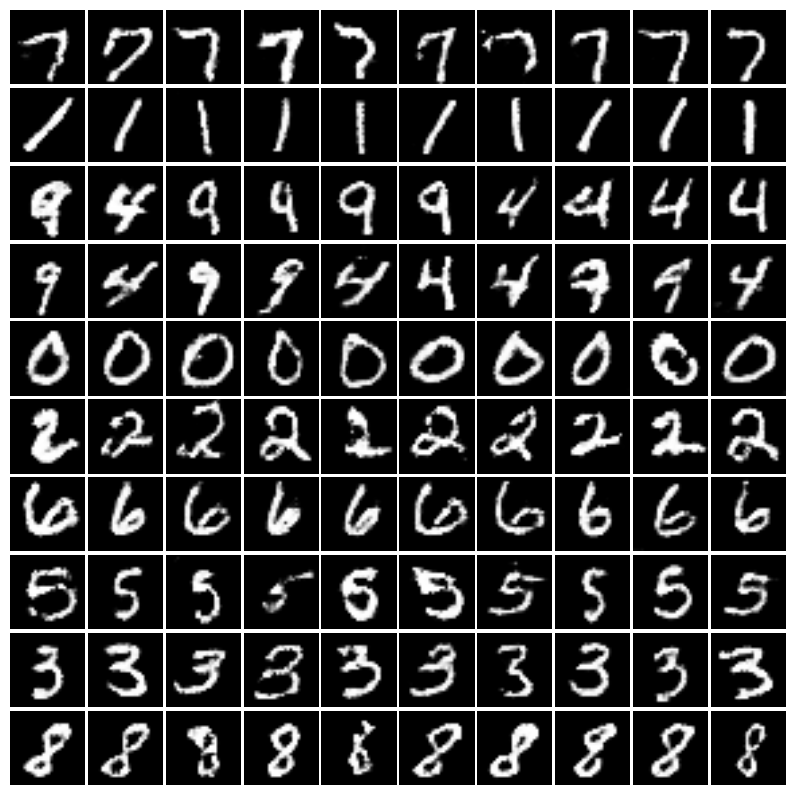

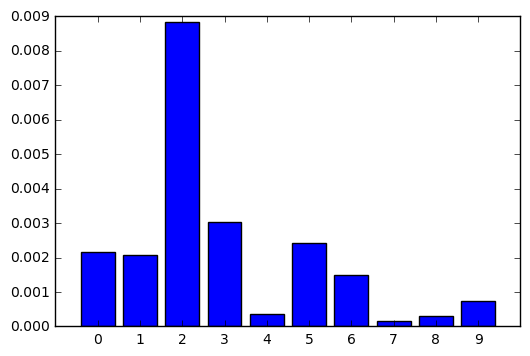

[4001/30000] D_loss: 1.3412 | G_loss: 0.7800 | Q_loss: 0.0026
[ 0.00217045  0.00208396  0.00882433  0.00303607  0.00034889  0.00242052
  0.0014837   0.00015596  0.00030963  0.00073096]


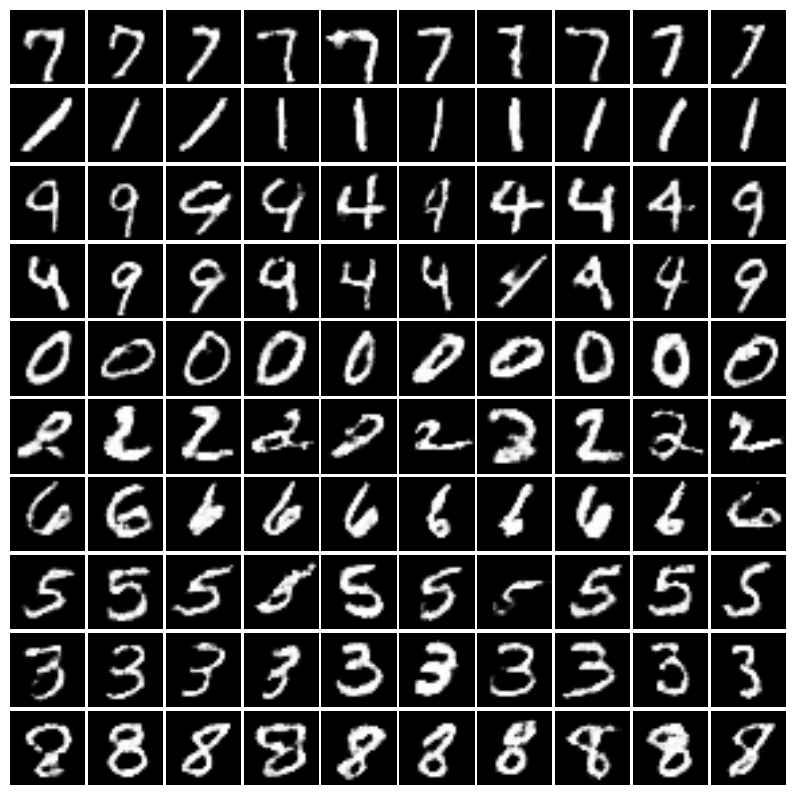

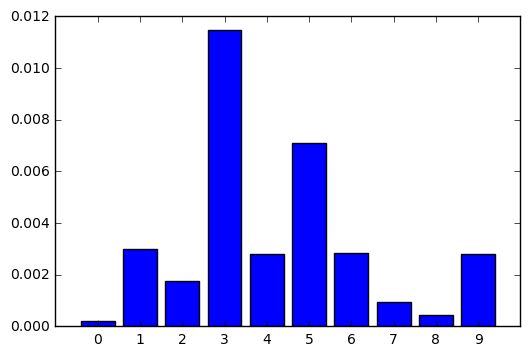

[5001/30000] D_loss: 1.3076 | G_loss: 0.7951 | Q_loss: 0.0039
[ 0.00020437  0.00298721  0.00175063  0.01146281  0.00281133  0.00709792
  0.00284955  0.00095698  0.00042727  0.00281577]


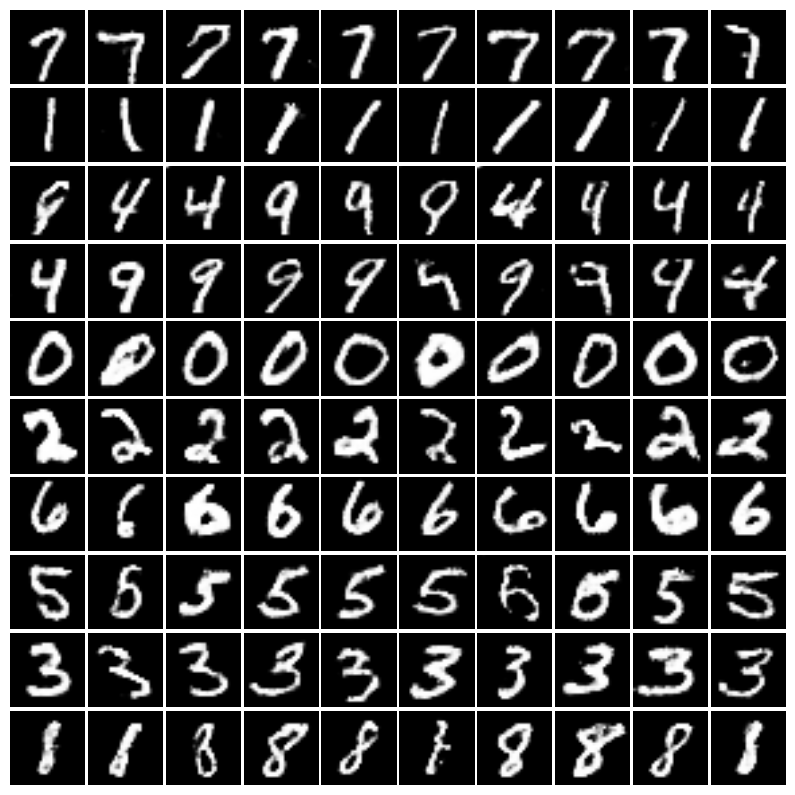

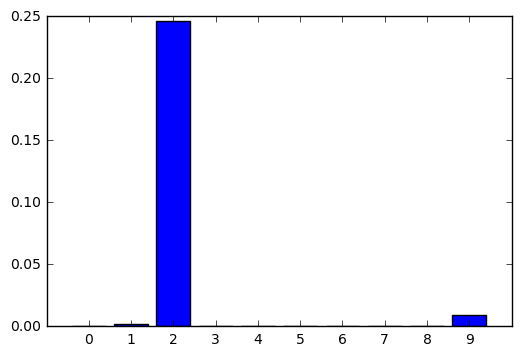

[6001/30000] D_loss: 1.3479 | G_loss: 0.8089 | Q_loss: 0.0168
[  2.27290944e-04   2.29202859e-03   2.46490384e-01   4.54993726e-05
   2.48271770e-04   3.20226933e-04   8.70977394e-05   1.94262888e-04
   5.85599057e-04   9.32838220e-03]


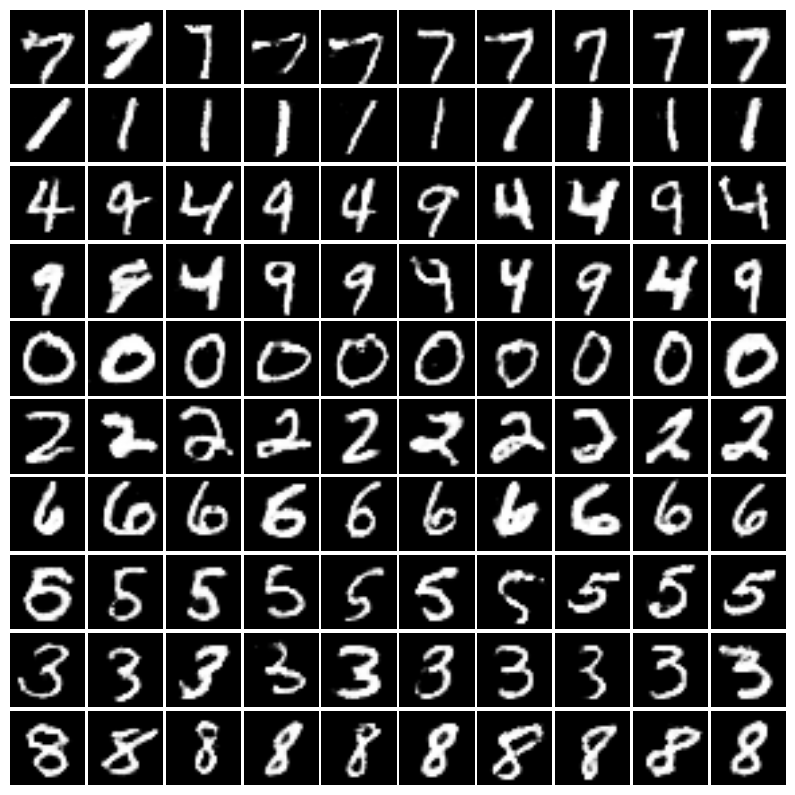

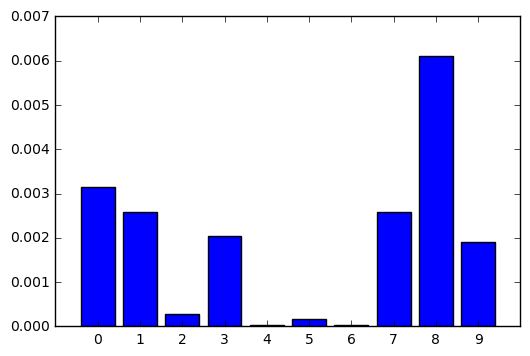

[7001/30000] D_loss: 1.3156 | G_loss: 0.8596 | Q_loss: 0.0022
[  3.13998076e-03   2.58506990e-03   2.84603208e-04   2.04091750e-03
   3.55233647e-05   1.66248719e-04   3.60234137e-05   2.57948934e-03
   6.11135755e-03   1.91249724e-03]


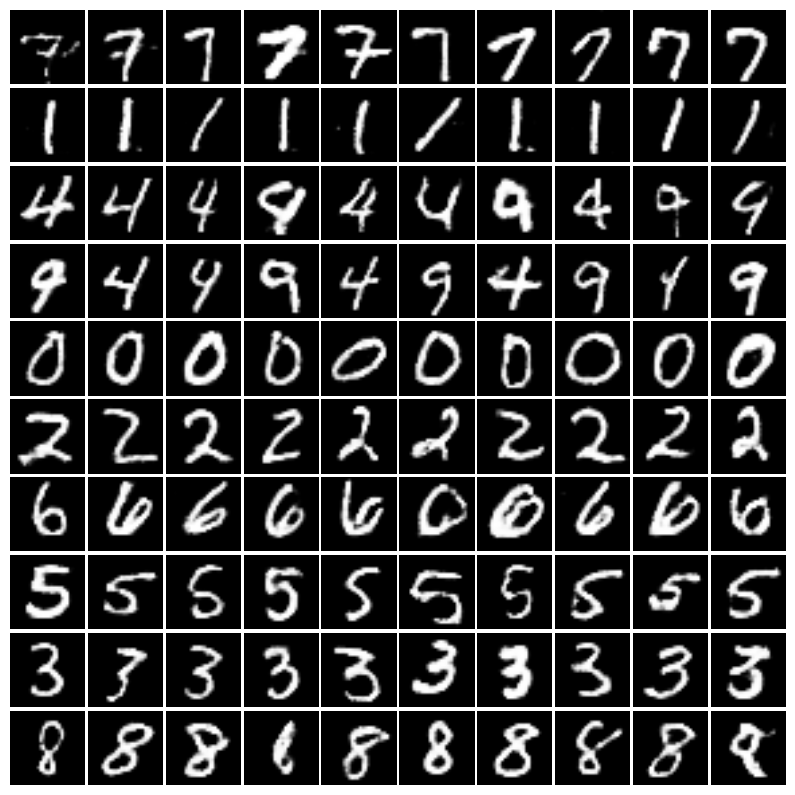

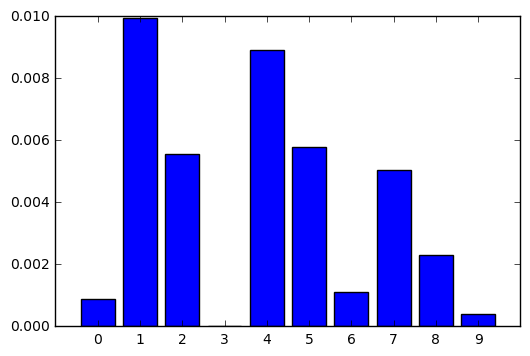

[8001/30000] D_loss: 1.2658 | G_loss: 0.8311 | Q_loss: 0.0044
[  8.84142284e-04   9.93587494e-03   5.54715615e-03   1.61988816e-05
   8.91830639e-03   5.79300834e-03   1.09759075e-03   5.05985205e-03
   2.32007400e-03   3.95181482e-04]


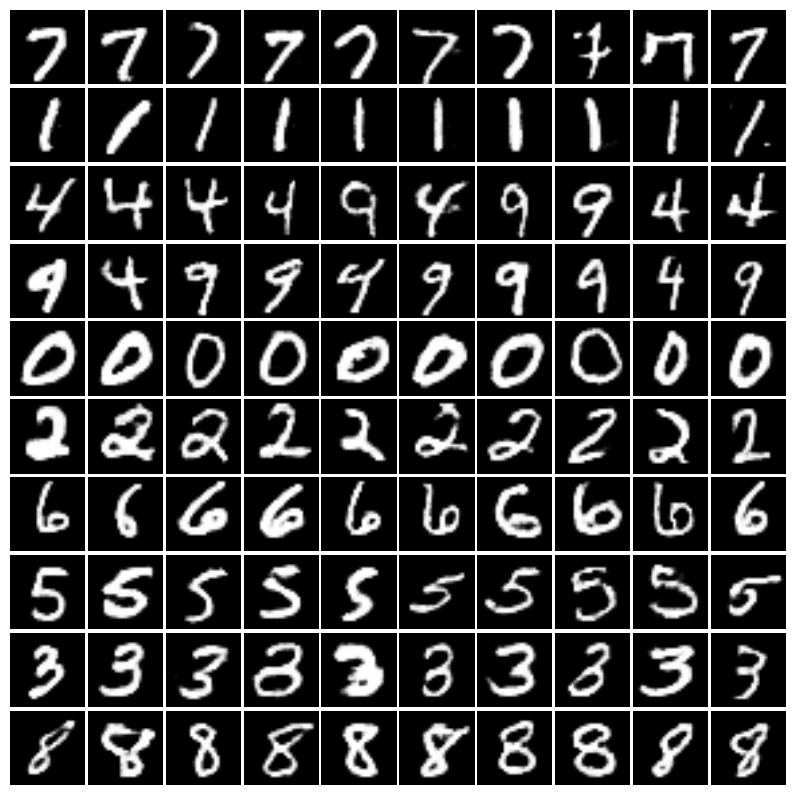

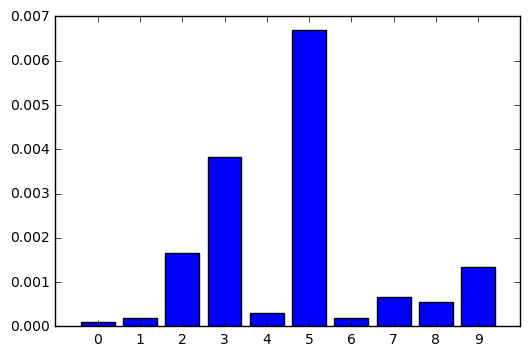

[9001/30000] D_loss: 1.1840 | G_loss: 0.9099 | Q_loss: 0.0015
[ 0.00010233  0.00019661  0.00165372  0.00383334  0.00030413  0.00670377
  0.00019734  0.0006579   0.00054895  0.00134615]


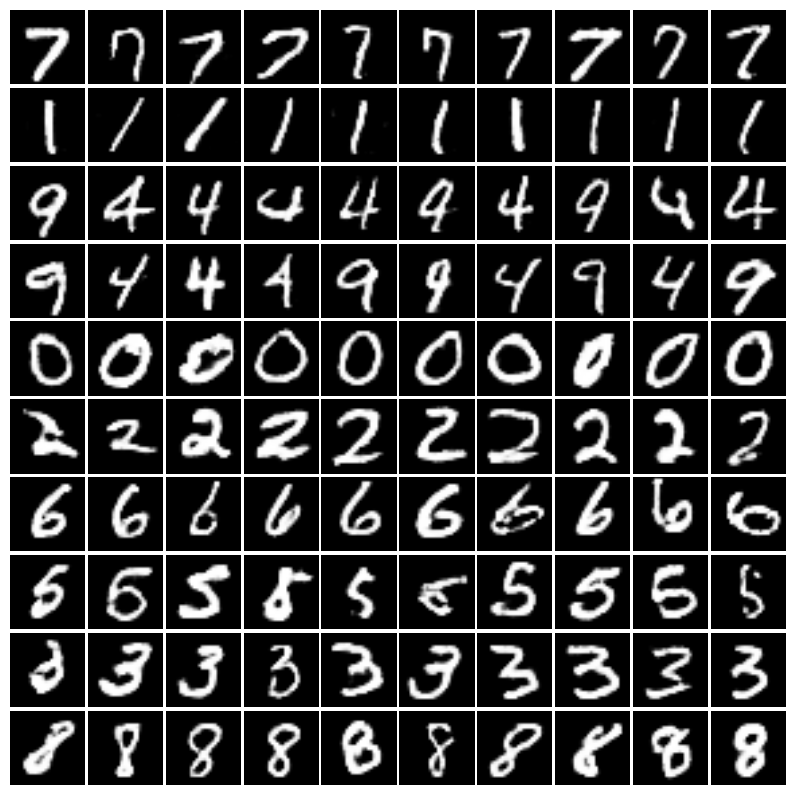

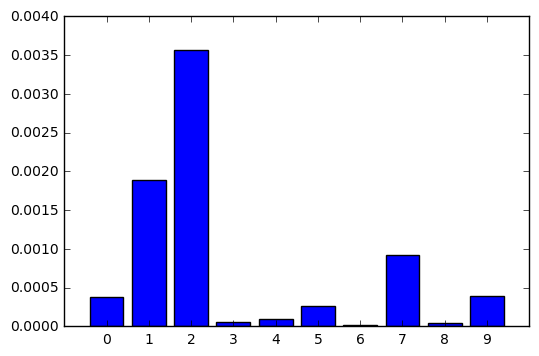

[10001/30000] D_loss: 1.0903 | G_loss: 1.0390 | Q_loss: 0.0008
[  3.81341621e-04   1.89284144e-03   3.56261336e-03   5.61747396e-05
   9.78031118e-05   2.60964693e-04   1.30532502e-05   9.23085388e-04
   4.62734325e-05   3.94585203e-04]


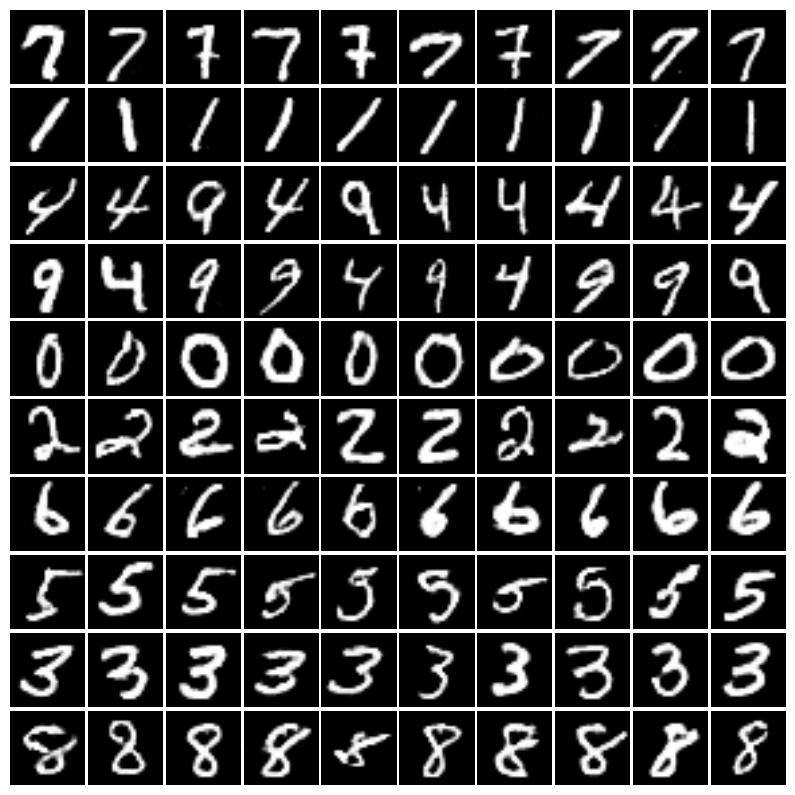

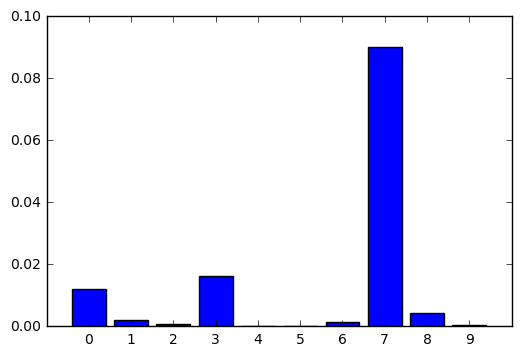

[11001/30000] D_loss: 1.1919 | G_loss: 1.0110 | Q_loss: 0.0144
[  1.22080441e-02   1.93169342e-03   8.42393700e-04   1.62398970e-02
   3.14053081e-05   7.92214843e-05   1.41173444e-03   9.01167836e-02
   4.26677276e-03   3.20606535e-04]


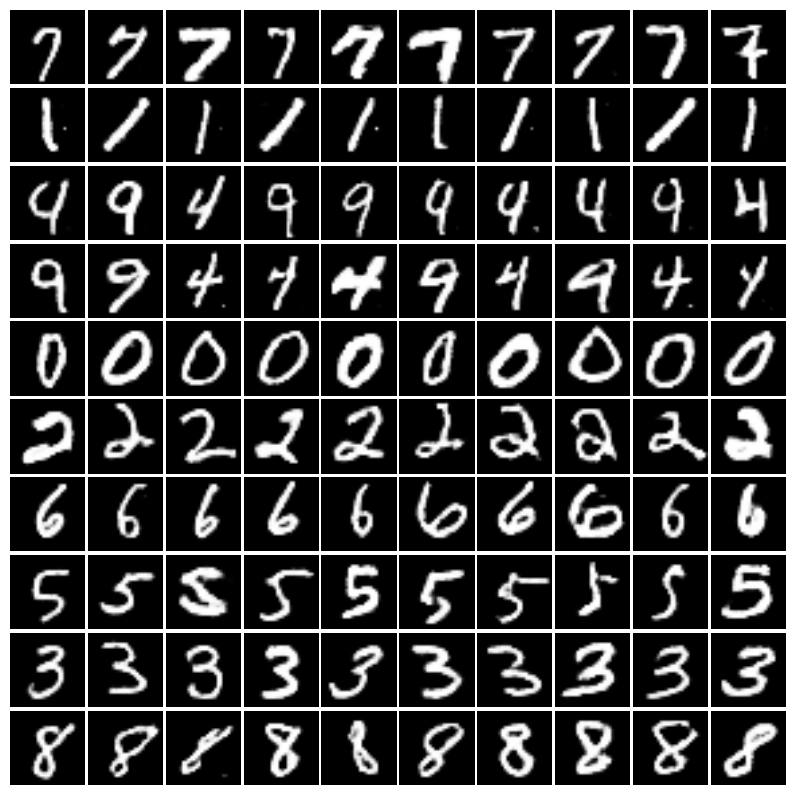

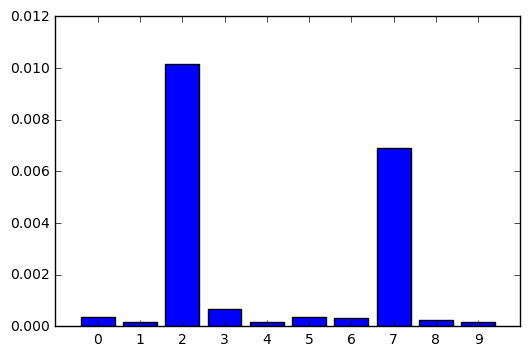

[12001/30000] D_loss: 0.9658 | G_loss: 1.1483 | Q_loss: 0.0020
[ 0.00038216  0.00018178  0.01016325  0.00068298  0.00015436  0.00037404
  0.00032688  0.0069191   0.00026033  0.00015375]


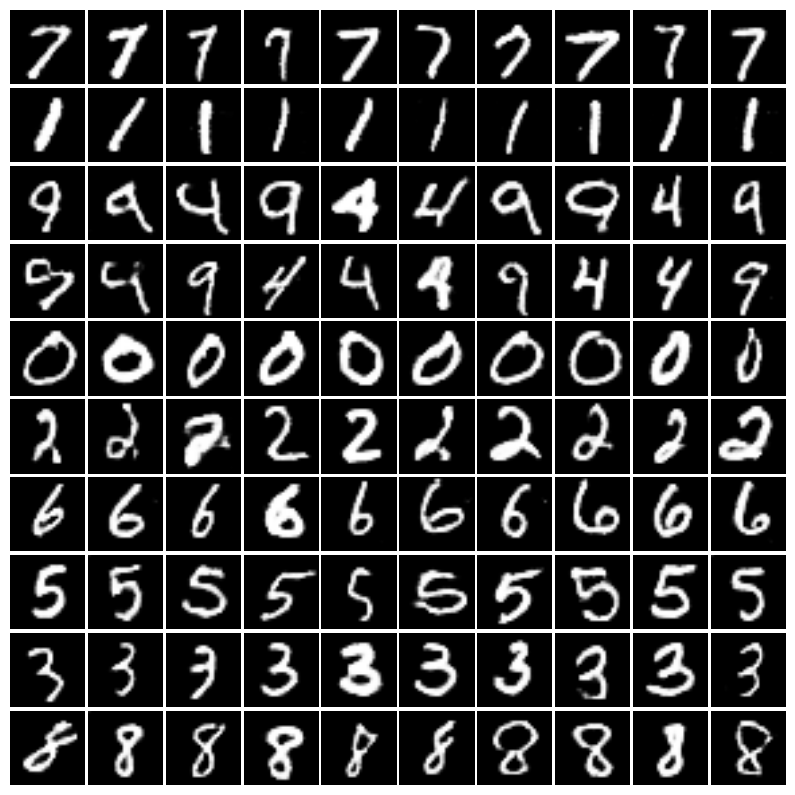

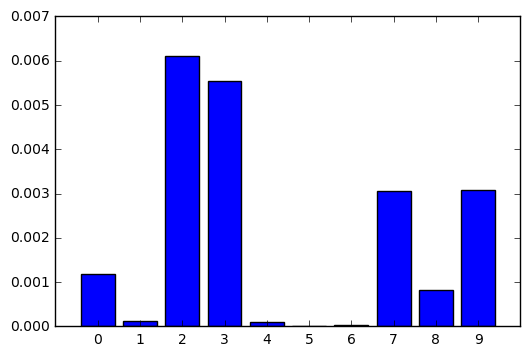

[13001/30000] D_loss: 0.9379 | G_loss: 1.1473 | Q_loss: 0.0022
[  1.17449266e-03   1.29809468e-04   6.11072285e-03   5.54331576e-03
   1.09652981e-04   6.42390358e-06   2.24105419e-05   3.05278548e-03
   8.26592473e-04   3.07071544e-03]


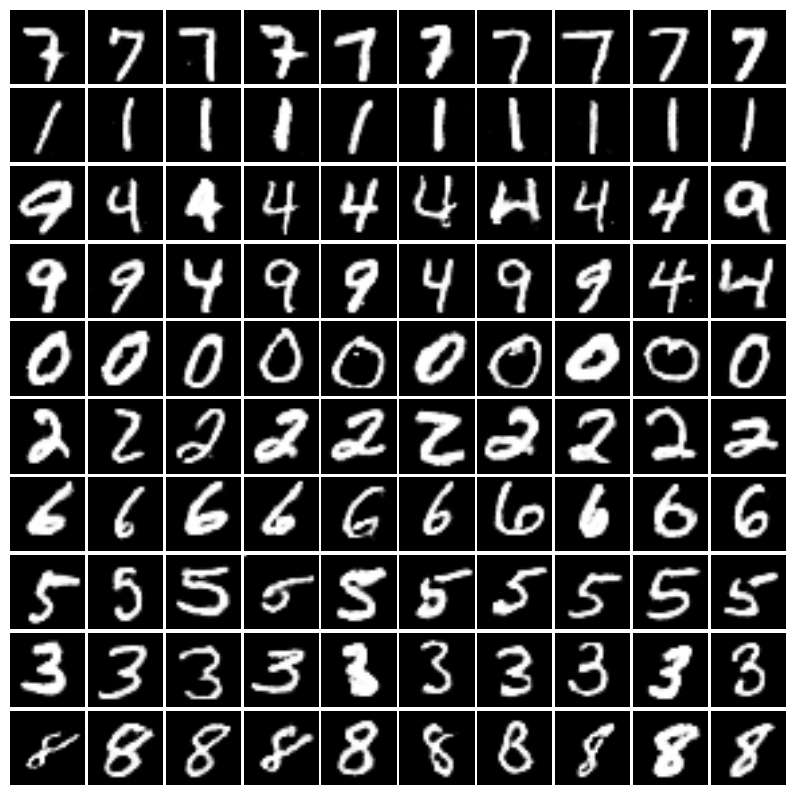

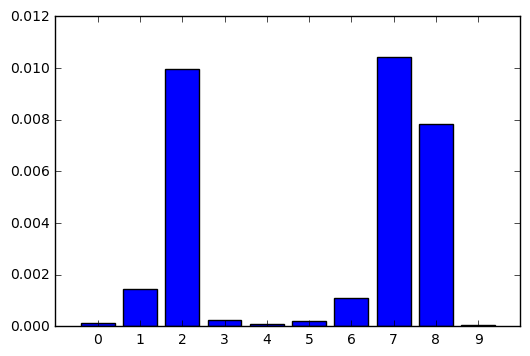

[14001/30000] D_loss: 0.9570 | G_loss: 1.3628 | Q_loss: 0.0034
[  1.25508664e-04   1.44679323e-03   9.97524977e-03   2.38642375e-04
   9.19850217e-05   2.13441279e-04   1.09273370e-03   1.04454013e-02
   7.83973161e-03   6.94497046e-05]


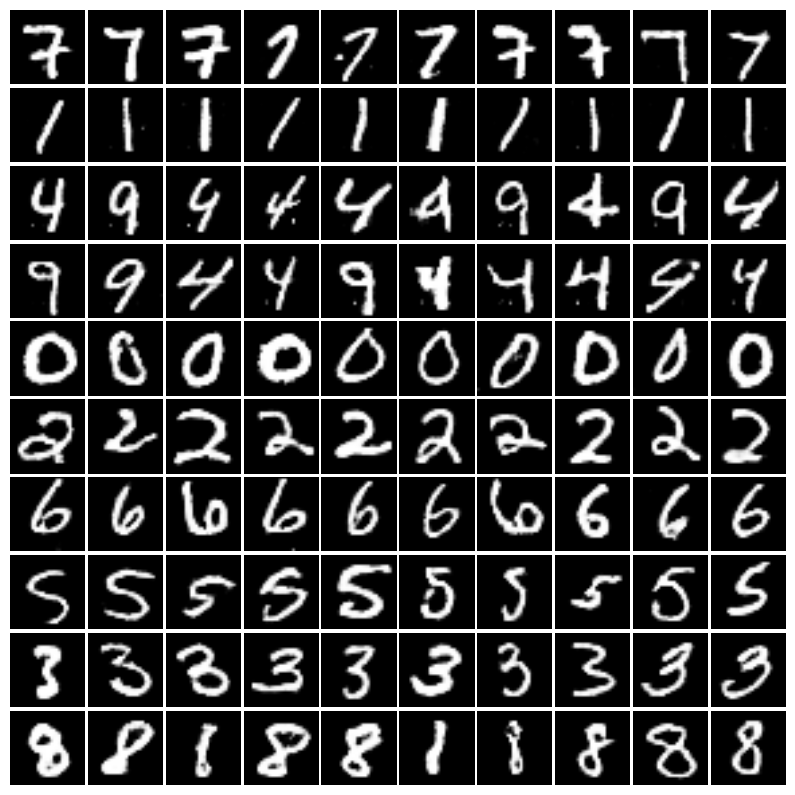

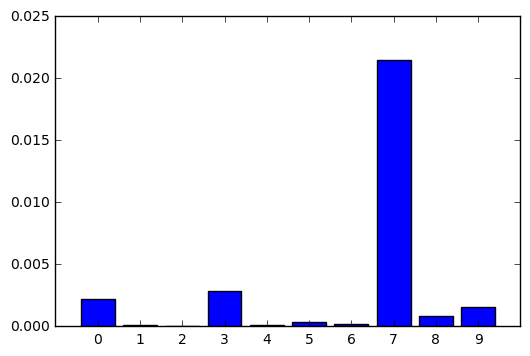

[15001/30000] D_loss: 0.8630 | G_loss: 1.5028 | Q_loss: 0.0052
[  2.21921313e-03   1.47794387e-04   2.59269898e-05   2.82449283e-03
   1.08087514e-04   3.34490758e-04   2.04529201e-04   2.14684967e-02
   8.28051559e-04   1.58156155e-03]


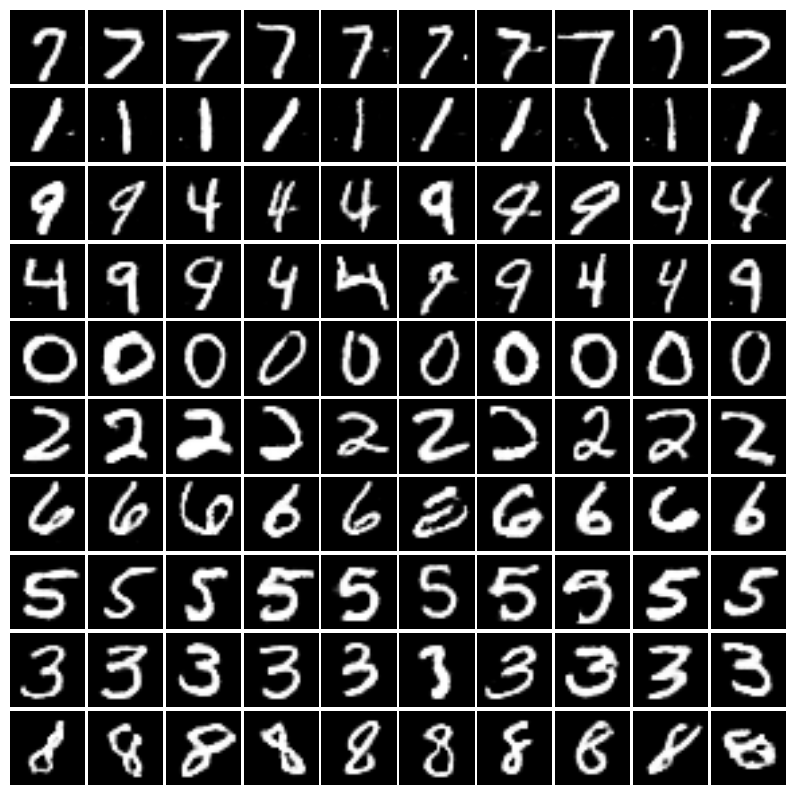

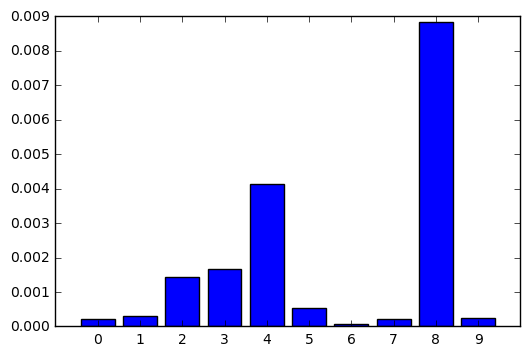

[16001/30000] D_loss: 0.8455 | G_loss: 1.2834 | Q_loss: 0.0018
[  2.11671186e-04   2.92920062e-04   1.42586524e-03   1.67754964e-03
   4.13474511e-03   5.34116029e-04   6.90155973e-05   2.04582528e-04
   8.85246960e-03   2.40667038e-04]


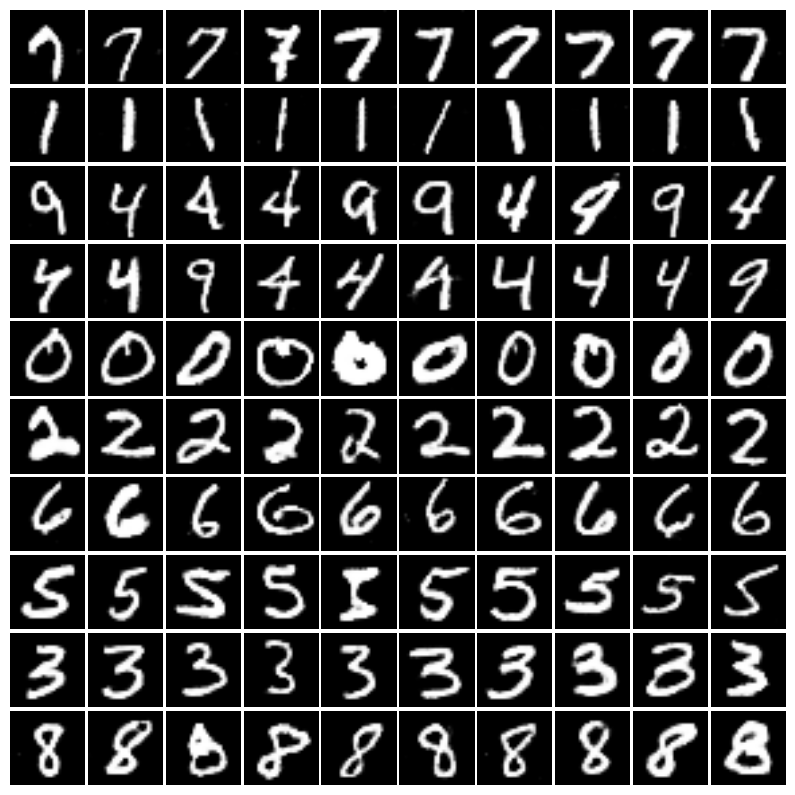

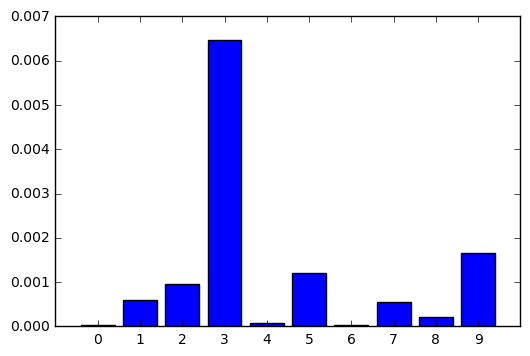

[17001/30000] D_loss: 0.7833 | G_loss: 1.5402 | Q_loss: 0.0014
[  3.20261432e-05   5.92194263e-04   9.66613073e-04   6.47664605e-03
   8.31586493e-05   1.20498025e-03   3.04058181e-05   5.50814922e-04
   2.19681351e-04   1.65844533e-03]


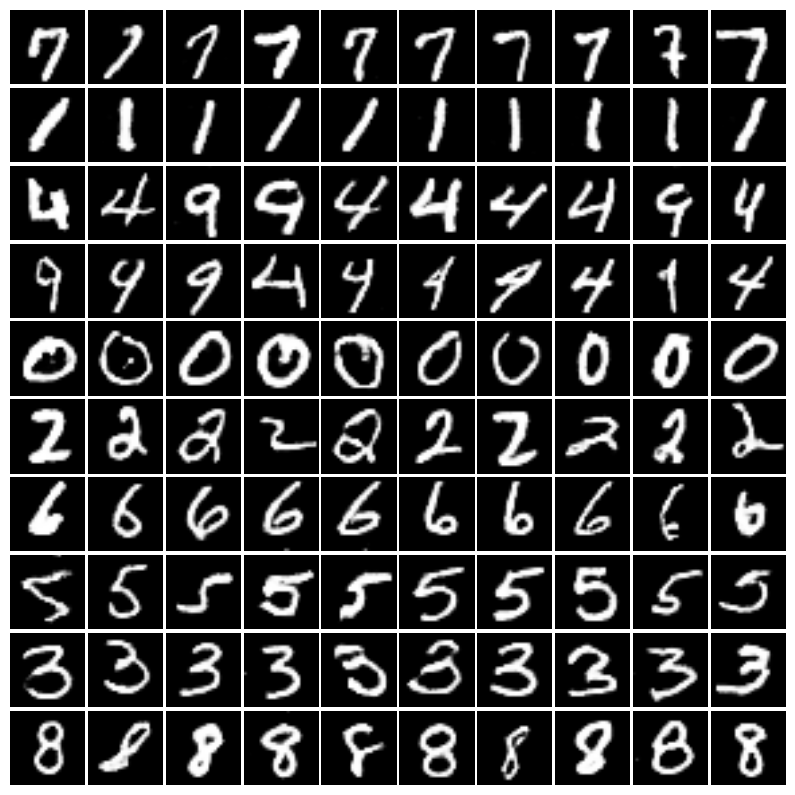

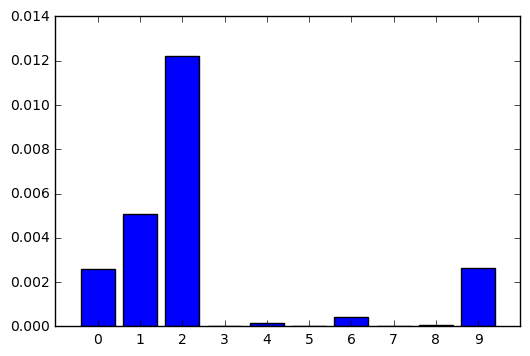

[18001/30000] D_loss: 0.6824 | G_loss: 1.7317 | Q_loss: 0.0027
[  2.61338497e-03   5.08925639e-03   1.22176240e-02   3.81545604e-05
   1.55699987e-04   5.18015812e-06   4.16482331e-04   3.13637194e-05
   7.51611344e-05   2.65711145e-03]


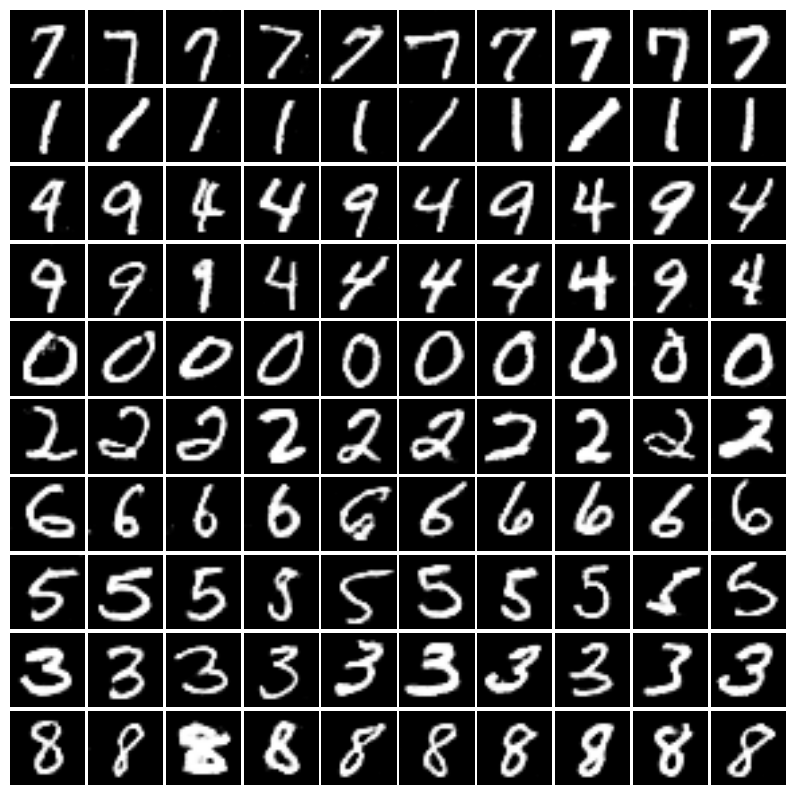

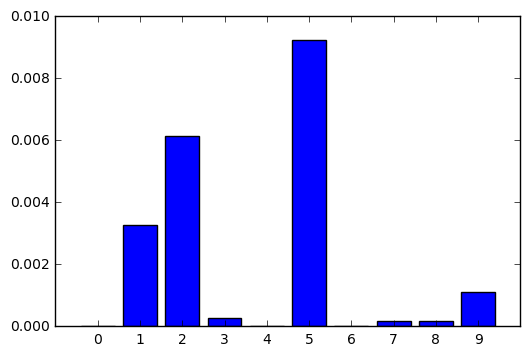

[19001/30000] D_loss: 0.7199 | G_loss: 1.8422 | Q_loss: 0.0024
[  2.23310965e-05   3.26913800e-03   6.13439444e-03   2.76354656e-04
   2.51754078e-05   9.25341309e-03   9.35240202e-06   1.90505762e-04
   1.67383816e-04   1.11475978e-03]


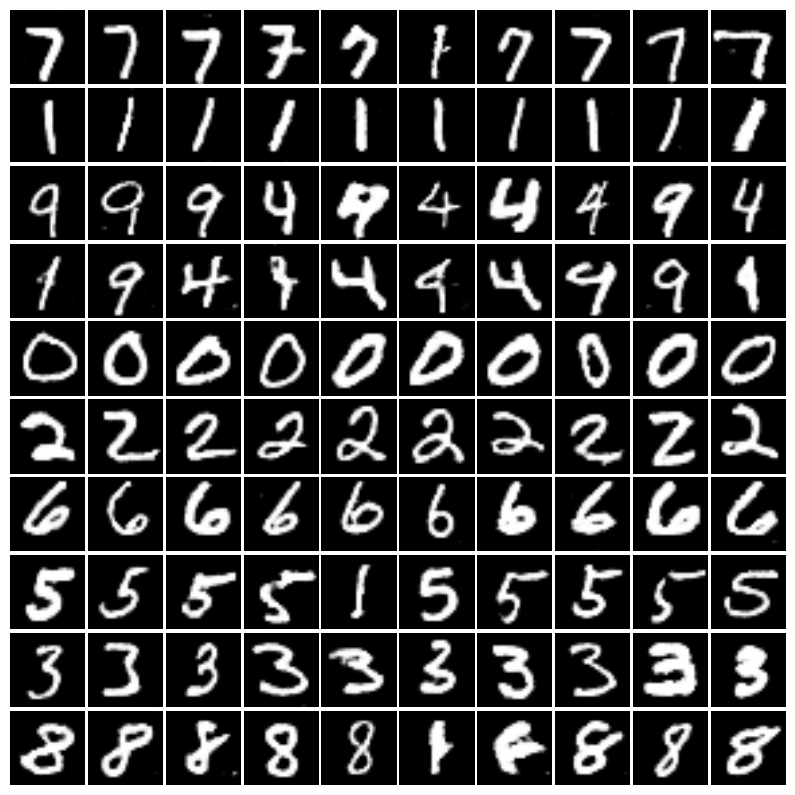

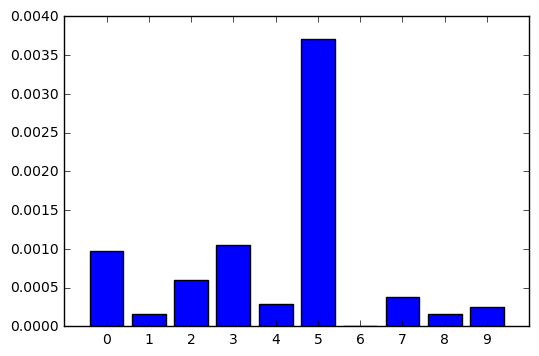

[20001/30000] D_loss: 0.6435 | G_loss: 1.6884 | Q_loss: 0.0009
[  9.70249777e-04   1.65819216e-04   6.03199049e-04   1.04787731e-03
   2.90561357e-04   3.71011910e-03   9.52471129e-06   3.82479743e-04
   1.57884070e-04   2.50634736e-04]


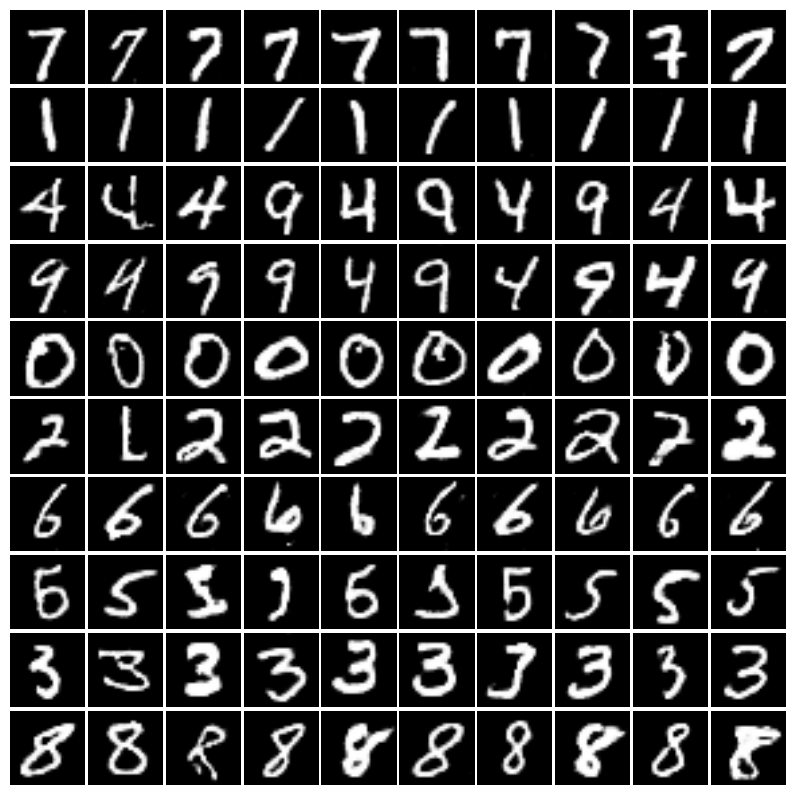

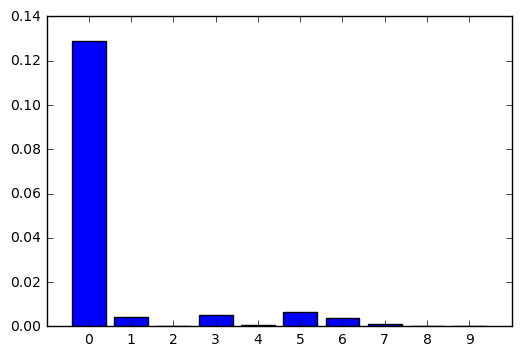

[21001/30000] D_loss: 0.6743 | G_loss: 1.6407 | Q_loss: 0.0225
[  1.28804860e-01   4.13215516e-03   2.62751155e-05   5.03923342e-03
   7.73351256e-04   6.35762017e-03   3.61830309e-03   1.02163694e-03
   1.85008463e-05   1.72412256e-04]


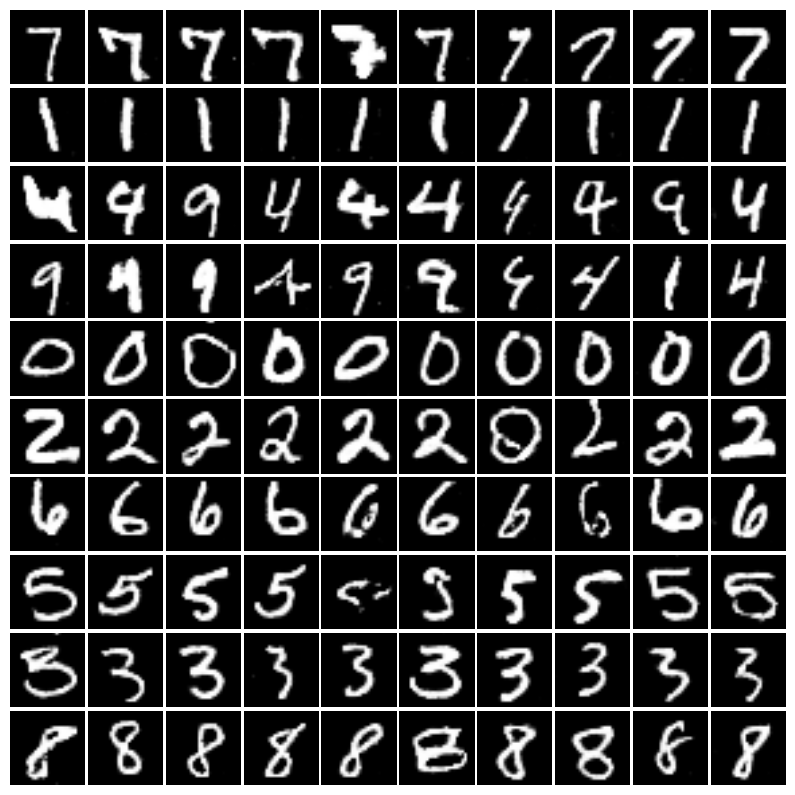

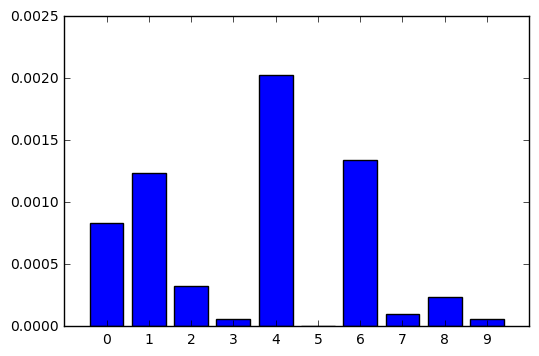

[22001/30000] D_loss: 0.6325 | G_loss: 1.9985 | Q_loss: 0.0007
[  8.32547504e-04   1.23506699e-03   3.29233052e-04   6.17851883e-05
   2.03065868e-03   4.76836931e-07   1.33829884e-03   1.02860466e-04
   2.38993210e-04   5.60819515e-05]


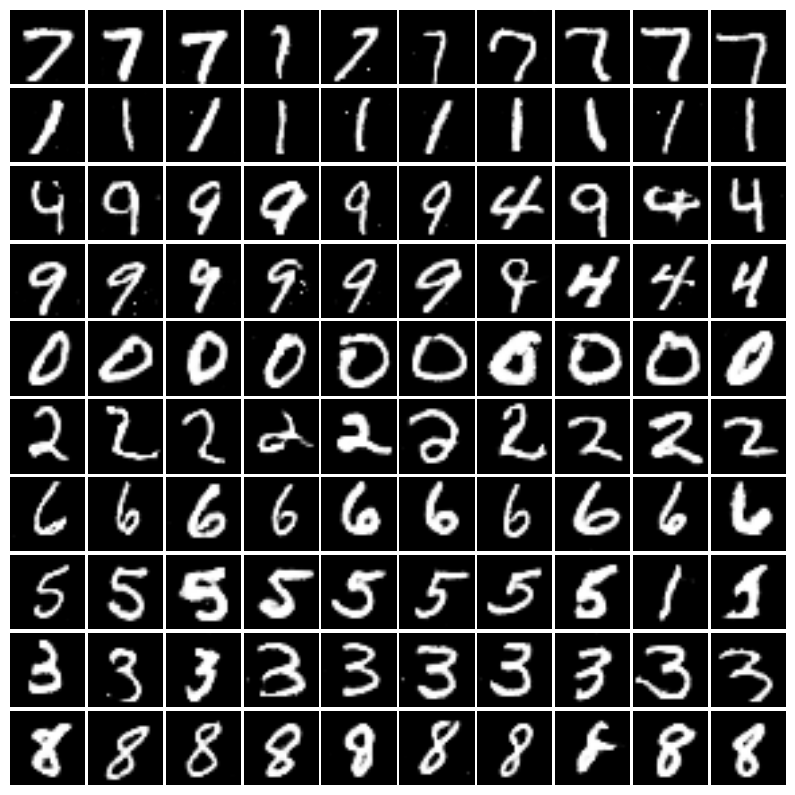

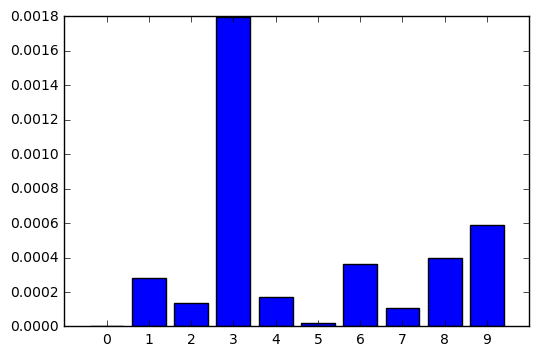

[23001/30000] D_loss: 0.5326 | G_loss: 2.0776 | Q_loss: 0.0004
[  4.56963596e-06   2.80971084e-04   1.34350299e-04   1.79841354e-03
   1.72791958e-04   1.88588384e-05   3.60889571e-04   1.05201791e-04
   3.96385044e-04   5.90445490e-04]


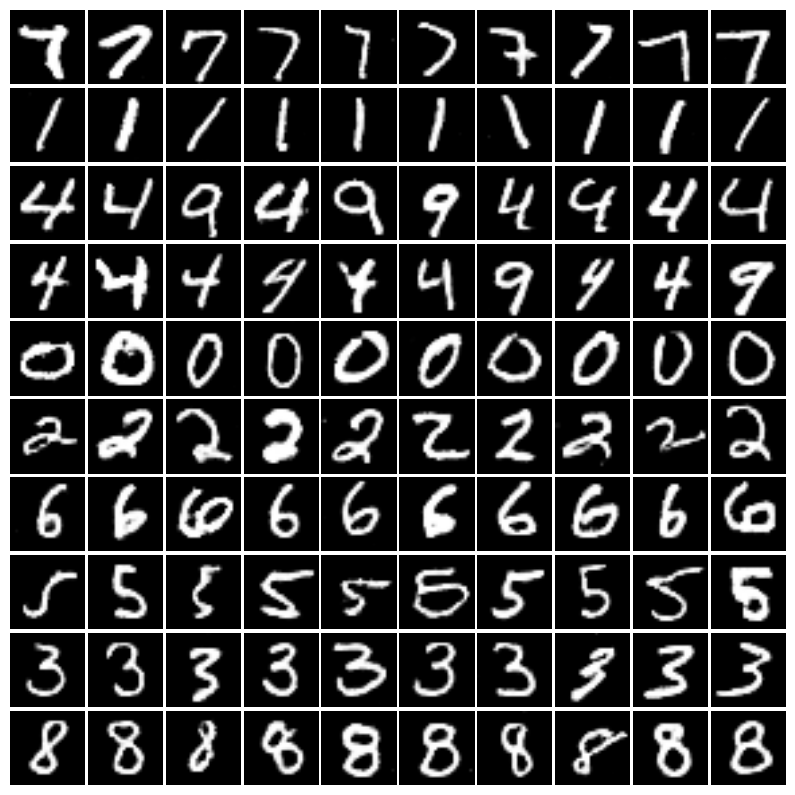

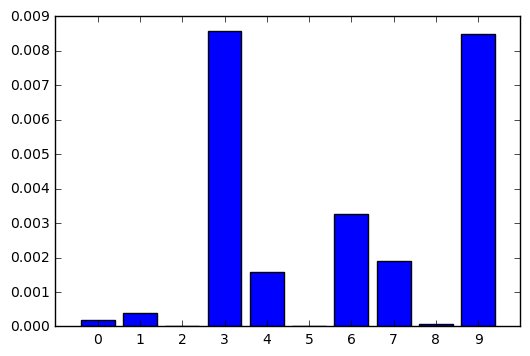

[24001/30000] D_loss: 0.5622 | G_loss: 2.0614 | Q_loss: 0.0030
[  1.78410016e-04   3.87253806e-04   3.57627759e-07   8.57674953e-03
   1.57103286e-03   8.73612580e-06   3.27810123e-03   1.89009806e-03
   6.40877452e-05   8.48765976e-03]


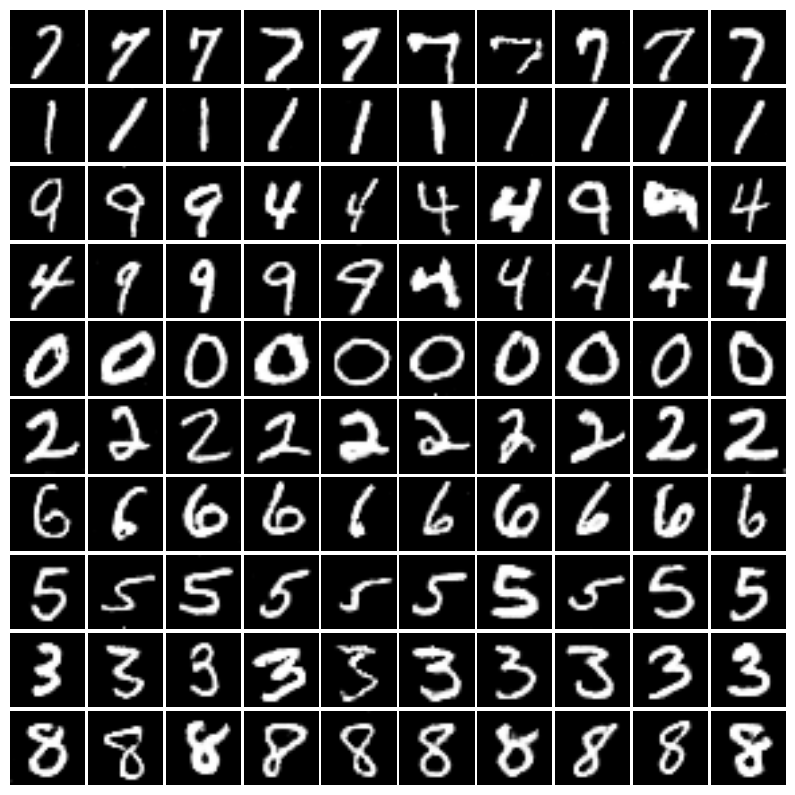

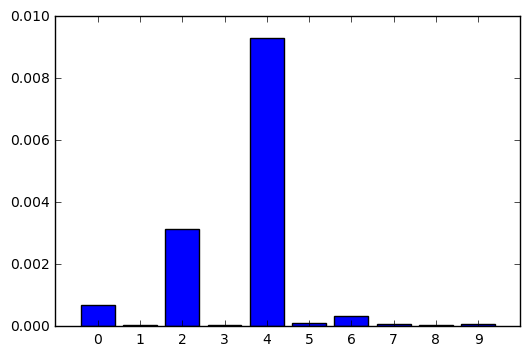

[25001/30000] D_loss: 0.4809 | G_loss: 2.3097 | Q_loss: 0.0015
[  6.89205044e-04   5.94170235e-05   3.13663509e-03   4.43974198e-05
   9.30356205e-03   1.04541964e-04   3.52065839e-04   6.47634699e-05
   3.66341492e-05   7.58019308e-05]


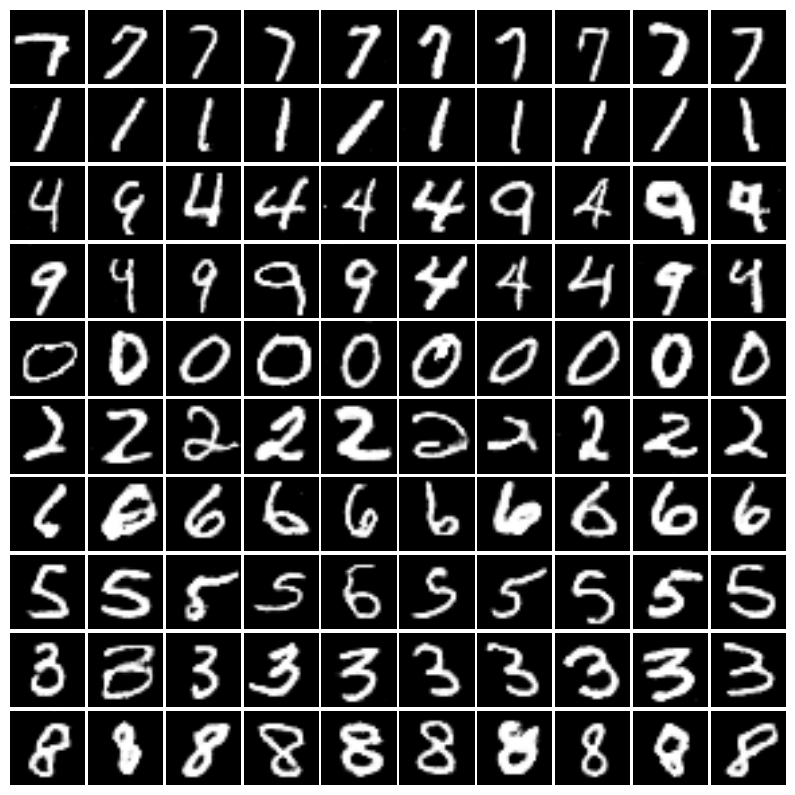

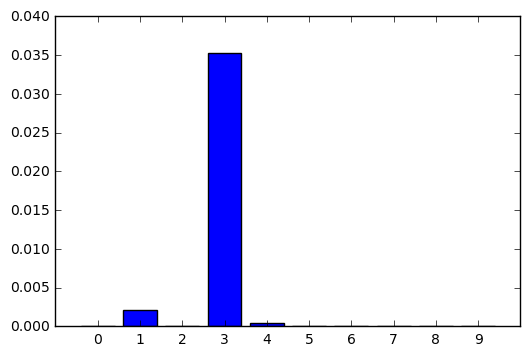

[26001/30000] D_loss: 0.5028 | G_loss: 2.3754 | Q_loss: 0.0048
[  4.75466198e-05   2.11034826e-03   7.26894697e-05   3.53281727e-02
   3.96031438e-04   5.05009053e-06   3.76381877e-05   8.34463865e-07
   1.15836032e-04   3.86868238e-05]


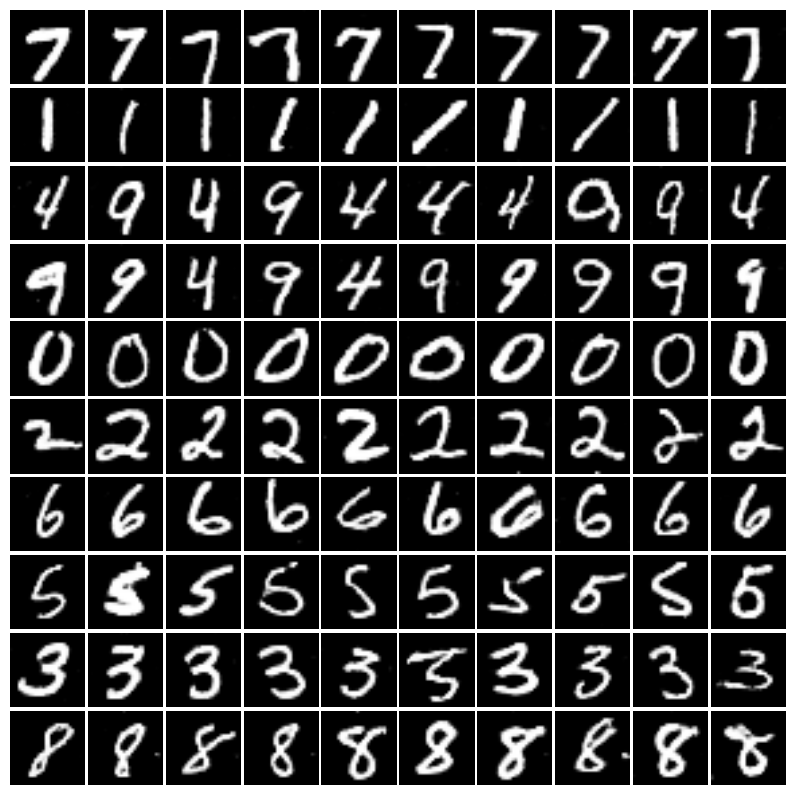

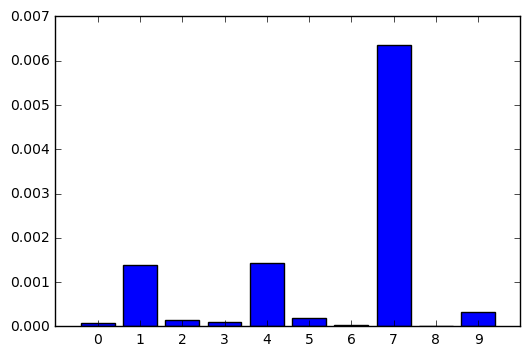

[27001/30000] D_loss: 0.4406 | G_loss: 2.5438 | Q_loss: 0.0010
[  7.26848325e-05   1.39565578e-03   1.43652296e-04   1.02608484e-04
   1.43548567e-03   2.01560492e-04   3.98189961e-05   6.35708237e-03
   1.61897299e-05   3.20275894e-04]


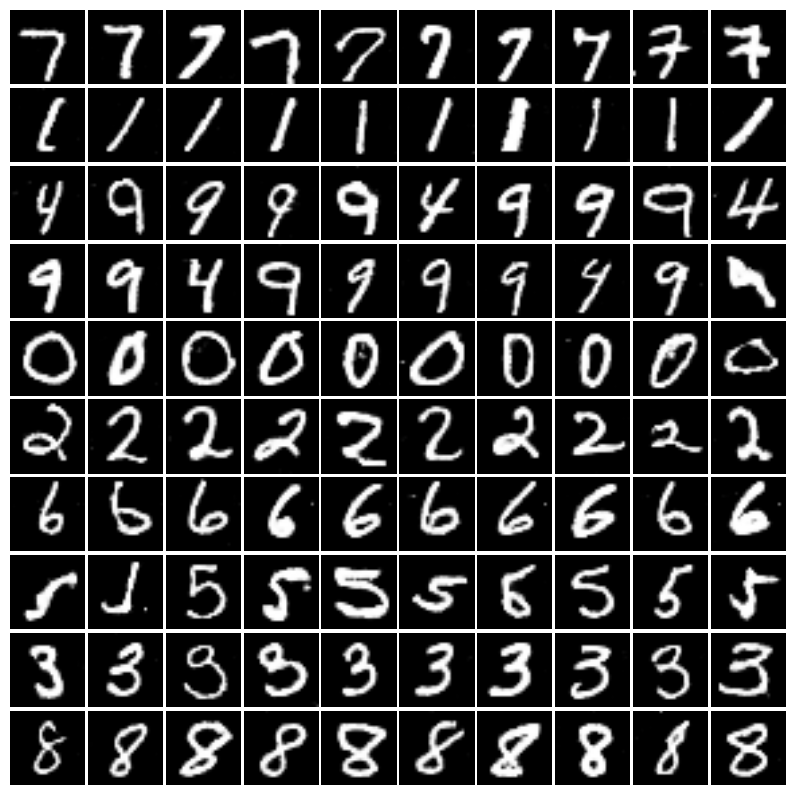

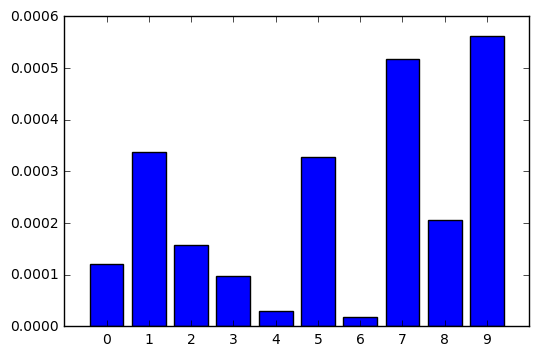

[28001/30000] D_loss: 0.4451 | G_loss: 2.4390 | Q_loss: 0.0002
[  1.20087039e-04   3.38041501e-04   1.58148519e-04   9.71700750e-05
   3.05002231e-05   3.28720844e-04   1.82580779e-05   5.16947257e-04
   2.06833209e-04   5.61843183e-04]


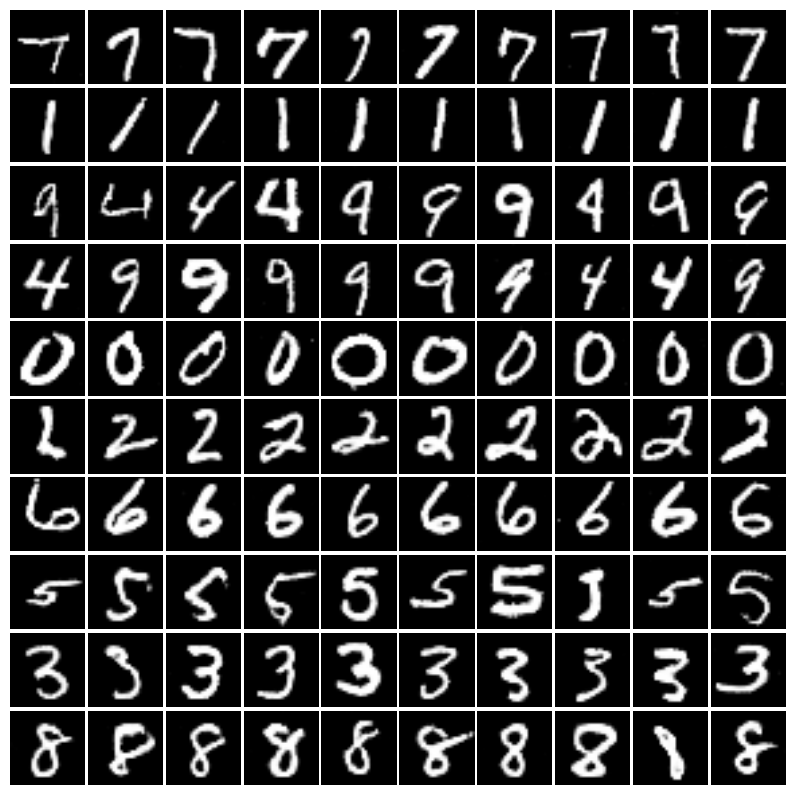

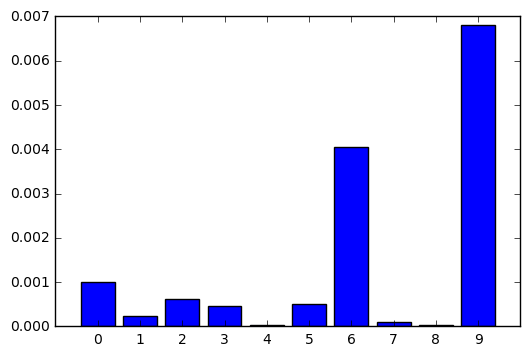

[29001/30000] D_loss: 0.3653 | G_loss: 2.6448 | Q_loss: 0.0015
[  1.00597041e-03   2.27115511e-04   6.27855455e-04   4.70859817e-04
   3.17889818e-05   5.04147172e-04   4.05251678e-03   1.10255829e-04
   2.17599654e-05   6.81485536e-03]


In [140]:
batch_size = 128
n_iter = 30000
print_step = 1000

sess = tf.Session()
sess.run(tf.global_variables_initializer())
writer = tf.summary.FileWriter("./tmp/", sess.graph)

for i in range(n_iter):
    if i % print_step == 0:
        plot_100()
        plt.show()
    
    batch_x, _ = mnist.train.next_batch(batch_size)
    z_ = sample_z(batch_size)
    c_ = sample_c(batch_size)
    
    _, D_loss_cur, summary_cur = sess.run([D_train_op, D_loss, summary_op], {X: batch_x, z: z_, c: c_, training: True})
    _, G_loss_cur, Q_loss_cur, cur_Q_loss_disc = sess.run([G_train_op, G_loss, Q_loss, exp_Q_loss_disc], 
                                                          {z: z_, c: c_, training: True})
#     cur_Q_loss_disc = sess.run([exp_Q_loss_disc], {z: z_, c: c_, training: True}) 
    
    exp_losses = np.zeros([c_disc_dim])
    exp_cnt = np.zeros([c_disc_dim])
    for j in range(batch_size):
        c_idx = np.argmax(c_[j])
        exp_losses[c_idx] += cur_Q_loss_disc[j]
        exp_cnt[c_idx] += 1
    exp_losses /= exp_cnt

# 이렇게 하나로 묶으면 전혀 워킹하지 않음.
# 이건 왜일까?
#     _, D_loss_cur, _, G_loss_cur, summary_cur = sess.run([D_train_op, D_loss, G_train_op, G_loss, summary_op], 
#                                                          {X: batch_x, z: z_, c: c_, training: True})
    writer.add_summary(summary_cur, i)
    
    if i % print_step == 0:
        y_pos = np.arange(c_disc_dim)
        plt.bar(y_pos, exp_losses, align='center')
        plt.xticks(y_pos, y_pos);
        plt.xlim([-1, 10]);
        plt.show()
        # plt.ylim([0, 2]);
        
        print('[{}/{}] D_loss: {:.4f} | G_loss: {:.4f} | Q_loss: {:.4f}'.
              format(i+1, n_iter, D_loss_cur, G_loss_cur, Q_loss_cur))
        print exp_losses

In [94]:
exp_losses

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [99]:
c_[0]

array([ 0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.])

In [98]:
np.argmax(c_[0])

3

In [ ]:
plot_c23()

In [ ]:
plot_c23(c2_=np.tile(np.linspace(-2, 2, 10), 10).reshape(-1, 1))

In [ ]:
plot_c23(c3_=np.tile(np.linspace(-2, 2, 10), 10).reshape(-1, 1))

In [ ]:
plot_c23(c2_=np.tile(np.linspace(-2, 2, 10), 10).reshape(-1, 1), c3_=np.tile(np.linspace(-2, 2, 10), 10).reshape(-1, 1))

In [118]:
exp_losses

array([ 0.36927538,  0.62923002,  0.60188719,  0.8252344 ,  0.47076179,
        0.75249896,  0.46289086,  0.72486891,  0.77446722,  0.59097655])

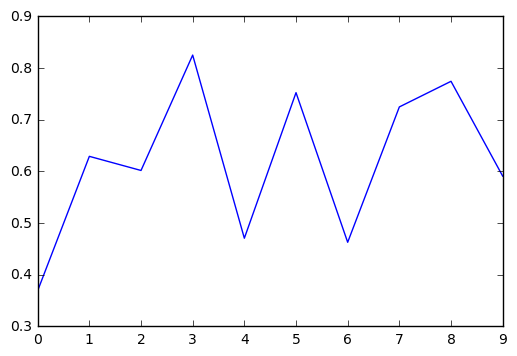

In [120]:
plt.plot(exp_losses)

In [126]:
np.arange(c_disc_dim)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

(0, 2)

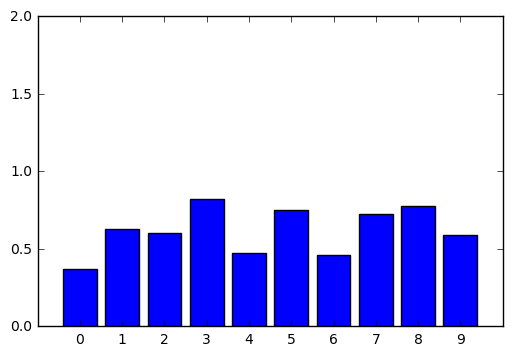